# GIFs: download rate R(K,L,T), amount of servers N(K,L,T)

# Comparsion in terms of download rate: Chang, Kakar, GASP algorithms

# GASP download rate calculation (GASP_BIG + GASP_SMALL)

In [1]:
def GASP_RATE(K, L, T):
    R = 0
    if L <= K:
        if T == 1 and T < L and L <= K:
            R = (K * L) / (K * L + K + L)
        if T >= 2 and T < L and L <= K:
             R = (K * L) / (K * L + K + L + T * T + T - 3)
        if L <= T and T < K:
             R = (K * L) / ((K + T) * (L + 1) - 1)
        if L <= K and K <= T:
            R = (K * L) / (2 * K * L + 2 * T - 1)
    elif K < L:
        if T == 1 and T < K and K <= L:
            R = (K * L) / (K * L + K + L)
        if T >= 2 and T < K and K <= L:
             R = (K * L) / (K * L + K + L + T * T + T - 3)
        if K <= T and T < L:
             R = (K * L) / ((L + T) * (K + 1) - 1)
        if K <= L and L <= T:
            R = (K * L) / (2 * K * L + 2 * T - 1)
    return R

# Examples from paper: K = 20, L = 20, T = 1..60 and K = 10, L = 20, T = 1..60

Populating the interactive namespace from numpy and matplotlib


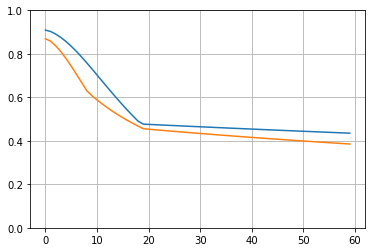

In [4]:
%pylab inline

a = []
b = []
for i in range(1,61):
    a.append(GASP_RATE(K = 20, L = 20, T = i))
    b.append(GASP_RATE(K = 10, L = 20, T = i))
    
plot(a)
plot(b)
ylim(0,1)
plt.grid()
plt.show()

# Set of R for each L, K, T combination

In [259]:
K, L, T_frames = 20, 20, 100

def gen_frames(K, L, T = T_frames):
    R = np.zeros([T, K, L])
    for t in range(1, T + 1):
        for k in range(1, K + 1):
            for l in range(1, L + 1):
                R[t-1, K - k, l - 1] = GASP_RATE(K = k, L = l, T = t)
    return R

R = gen_frames(K, L, T = T_frames)
len(R)

100

# Set of Images for each T

In [260]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_fig(t, R):
    fig = plt.figure(figsize=(16, 12))
    plt.title("Download Rate for T = "+ str(t+1), fontsize=25)
    sns.heatmap(R[t], vmin=0, vmax=1, center= 0.5, cmap= 'gnuplot2', cbar=True, square=True, annot=False,
                linewidths=.5,
                xticklabels=np.linspace(1,20,20, dtype = 'int'),
                yticklabels=np.linspace(20,1,20, dtype = 'int'),
                cbar_kws= {'orientation': 'vertical'}
                )
    plt.ylabel('K amount', fontsize=20)
    plt.xlabel('L amount', fontsize=20)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.close(fig)
    return fig


nframes = T_frames
for i in range(0, nframes,1):
    fig = plot_fig(i, R)
    fig.savefig('Images/Image_T=' + str(i+1))
    plt.close('all')

# GIF creating (download rates R)

In [7]:
import glob
from PIL import Image

path = 'Images'
all_files = []
for i in range(1,T_frames+1):
    all_files += glob.glob(path+"/Image_T="+str(i)+".png")

fp_in = all_files
fp_out = "Images/movie.gif"

img, *imgs = [Image.open(f) for f in all_files]
img.save(fp = fp_out, format='GIF', append_images=imgs,
         save_all = True, duration=100, loop=0)

# GASP N servers (GASP_BIG + GASP_SMALL)

In [313]:
# GASP BIG (N calculation)
def get_N_GB(K, L, T):
    N = 0
    if L <= K:
        if T < K:
            N = (K + T) * (L + 1) - 1
        elif T >= K:
            N = 2 * K * L + 2 * T - 1
    if L > K:
        if T < L:
            N = (L + T) * (K + 1) - 1
        elif T >= L:
            N = 2 * K * L + 2 * T - 1
    return N

# GASP SMALL (N calculation)
def get_N_GS(K, L, T):
    N = 0
    if K <= L:
        if L == 1 and T < K:
            N = 2*K + T*T
        elif L == 1 and T >= K:
            N = K*T + K + T
        elif L >=2 and T == 1 and T < K:
            N = K*L + K + L
        elif L >=2 and T >=2 and T < K:
            N = K*L + K + L + T*T + T - 3
        elif L >= 2 and K <= T and T <= K * (L - 1) + 1:
            N = K*L + K*T + L + 2*T - 3 - ((T - 2) / K)
        elif L >= 2 and T >= K * (L - 1) + 1:
            N = 2*K*L + K*T - K + T
    if K > L:
        if K == 1 and T < L:
            N = 2*L + T*T
        elif K == 1 and T >= L:
            N = L*T + L + T
        elif K >=2 and T == 1 and T < L:
            N = K*L + K + L
        elif K >=2 and T >= 2 and T < L:
            N = K*L + K + L + T*T + T - 3
        elif K >= 2 and L <= T and T <= L * (K - 1) + 1:
            N = K*L + L*T + K + 2*T - 3 - ((T - 2) / L)
        elif K >= 2 and T >= L * (K - 1) + 1:
            N = 2*K*L + L*T - L + T
    return N

def GASP_N(K, L, T):
    min_KL = np.minimum(K, L)
    if T < min_KL:
        N = get_N_GS(K, L, T)
        
    if T >= min_KL:
        N = get_N_GB(K, L, T)
        
    return N

# Set of N for each L, K, T combination

In [316]:
K, L, N_frames = 20, 20, 100
T = N_frames

def gen_frames_N(K, L, T):
    N = np.zeros([T, K, L])
    for t in range(1, T + 1):
        for k in range(1, K + 1):
            for l in range(1, L + 1):
                N[t-1, K - k, l - 1] = GASP_N(K = k, L = l, T = t)
    return N/1000

N = gen_frames_N(K, L, T)

# Set of Images for each T

In [328]:
def plot_fig1(t, R):
    fig = plt.figure(figsize=(15, 12))
    plt.title("Servers N/1000, T= "+ str(t+1), fontsize=25)
    sns.heatmap(R[t], vmin=0, vmax = N[99].max(), center= N[99].max()/2, cmap= 'jet', cbar=True, square=True, annot=True,
                linewidths=.5,
                xticklabels=np.linspace(1,20,20, dtype = 'int'),
                yticklabels=np.linspace(20,1,20, dtype = 'int'),
                cbar_kws= {'orientation': 'vertical'}
                )
    plt.ylabel('K amount', fontsize=20)
    plt.xlabel('L amount', fontsize=20)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.close(fig)
    return fig


tframes = N_frames
for i in range(0, tframes,1):
    fig = plot_fig1(i, N)
    fig.savefig('Images_N/ImageN_T=' + str(i+1))
    plt.close('all')

# GIF creating (servers amount N)

In [327]:
import glob
from PIL import Image

path = 'Images_N'
all_files = []
for i in range(1,T_frames+1):
    all_files += glob.glob(path+"/ImageN_T="+str(i)+".png")

fp_in = all_files
fp_out = "Images_N/movieN.gif"

img, *imgs = [Image.open(f) for f in all_files]
img.save(fp = fp_out, format='GIF', append_images=imgs,
         save_all = True, duration=100, loop=0)

# Different algorithms comparsion: CHANG, KAKAR, GASP

In [384]:
def CHANG_RATE(K, L, T):
    R = (K * K) / (K + T) ** 2
    return R

In [387]:
def KAKAR_RATE(K, L, T):
    R = (K * L) / ((K + T) * (L + 1) - 1)
    return R

In [391]:
def GASP_RATE(K, L, T):
    R = 0
    if L <= K:
        if T == 1 and T < L and L <= K:
            R = (K * L) / (K * L + K + L)
        if T >= 2 and T < L and L <= K:
             R = (K * L) / (K * L + K + L + T * T + T - 3)
        if L <= T and T < K:
             R = (K * L) / ((K + T) * (L + 1) - 1)
        if L <= K and K <= T:
            R = (K * L) / (2 * K * L + 2 * T - 1)
    elif K < L:
        if T == 1 and T < K and K <= L:
            R = (K * L) / (K * L + K + L)
        if T >= 2 and T < K and K <= L:
             R = (K * L) / (K * L + K + L + T * T + T - 3)
        if K <= T and T < L:
             R = (K * L) / ((L + T) * (K + 1) - 1)
        if K <= L and L <= T:
            R = (K * L) / (2 * K * L + 2 * T - 1)
    return R

# Calculating downloat rate for each combination of K,L,T

In [392]:
%pylab inline

K, L = 20, 20
T = 60
ch_rate = np.zeros([K, L, T])
kk_rate = np.zeros([K, L, T])
ga_rate = np.zeros([K, L, T])
for k in range(1, K+1):
    for l in range(1, L+1):
        for t in range(1, T+1):
            ch_rate[k-1, l-1, t-1] = CHANG_RATE(K = k, L = l, T = t)
            kk_rate[k-1, l-1, t-1] = KAKAR_RATE(K = k, L = l, T = t)
            ga_rate[k-1, l-1, t-1] = GASP_RATE(K = k, L = l, T = t)

# All possible cases for our bounds

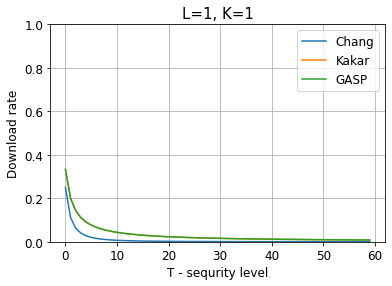

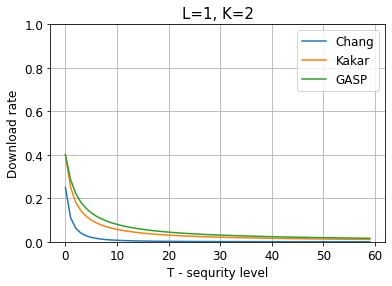

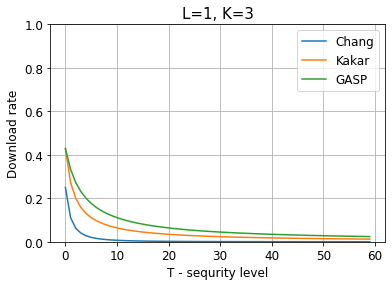

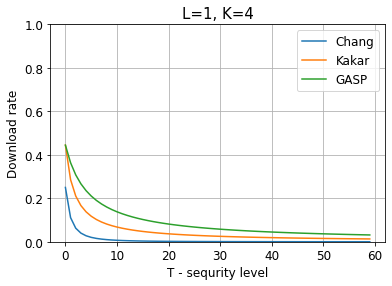

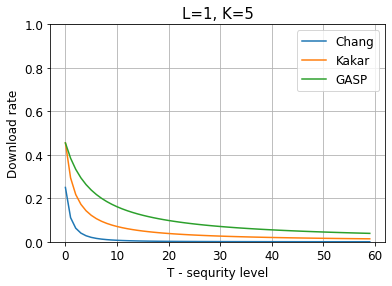

...

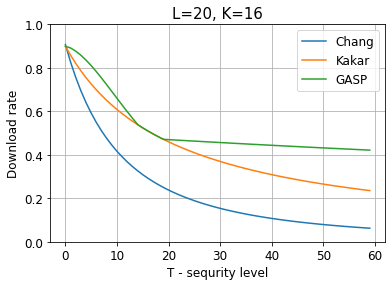

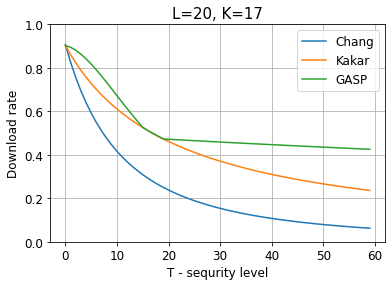

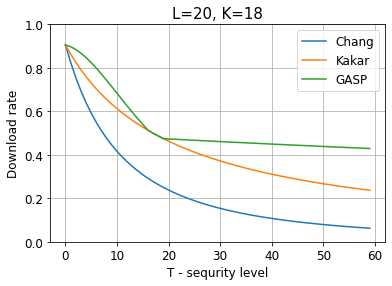

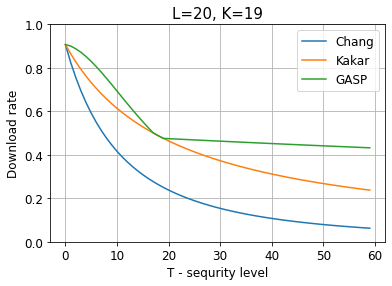

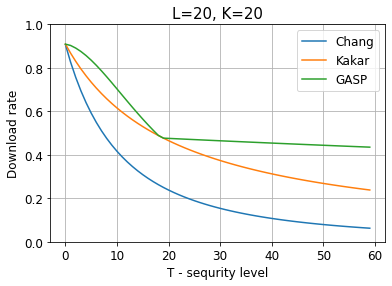

In [407]:
for k in range(0,20,1):
    for l in range(0,20,1):
        plot(ch_rate[k, l])
        plot(kk_rate[k, l])
        plot(ga_rate[k, l])

        plt.title('L=' + str(k+1)+', K='+ str(l+1), fontsize=15)
        plt.legend(['Chang', 'Kakar', 'GASP'], fontsize=12)
        plt.ylabel('Download rate', fontsize=12)
        plt.xlabel('T - sequrity level', fontsize=12)
        plt.yticks(fontsize=12)
        plt.xticks(fontsize=12)
        ylim(0,1)
        plt.grid()
        plt.show()